# Template for multi-pitch detection TP

*(reference: Klapuri) but with pitch detection with spectral sum

*From G. Richard (with help from P. Vernhet), MAJ:2019*

**python version : 3.6**

In [1]:
import os
import struct
import sys
import wave
from copy import deepcopy
from math import ceil

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyaudio
from tqdm import tqdm

cmap = mpl.colormaps["tab10"].colors


Functions

In [2]:
def load_music(file):
    return wave.open(file, "rb")


def play_music(file, chunk=1024):
    """
    Script from PyAudio doc
    """
    wf = load_music(file)
    p = pyaudio.PyAudio()
    stream = p.open(
        format=p.get_format_from_width(wf.getsampwidth()),
        channels=wf.getnchannels(),
        rate=wf.getframerate(),
        output=True,
    )
    data = wf.readframes(chunk)

    while data:
        stream.write(data)
        data = wf.readframes(chunk)

    stream.stop_stream()
    stream.close()
    p.terminate()


def plot_sound(data, times, name="default_name", save=False):
    plt.figure(figsize=(30, 4))
    plt.fill_between(times, data)
    plt.xlim(times[0], times[-1])
    plt.xlabel("time (s)")
    plt.ylabel("amplitude")
    if save:
        plt.savefig(name + ".png", dpi=100)
    plt.show()


def nextpow2(x):
    assert x > 0
    p = ceil(np.log2(x))
    x_ = 2**p
    assert 2 ** (p - 1) < x <= x_
    return p, x_


def f2idx(F, df):
    """
    Convert frequency to corresponding index in "frequencies" array
    """
    return ceil(F / df)


## 0 - Reading and playing .wav file

Choose the name of music for the rest of the notebook. Sounds are assumed to be set in a folder named 'sons' (same directory as notebook).

In [3]:
current_path = os.getcwd()
data_path = os.path.join(current_path, "sons")
filename = "A4_piano.wav"
music = os.path.join(data_path, filename)


### **Using wave**

In [4]:
wavefile = load_music(music)
print(wavefile.getparams())


_wave_params(nchannels=1, sampwidth=2, framerate=32000, nframes=31994, comptype='NONE', compname='not compressed')


In [5]:
play = True
if play:
    play_music(music)


ALSA lib confmisc.c:767:(parse_card) cannot find card '0'
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_card_driver returned error: No such file or directory
ALSA lib confmisc.c:392:(snd_func_concat) error evaluating strings
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_concat returned error: No such file or directory
ALSA lib confmisc.c:1246:(snd_func_refer) error evaluating name
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_refer returned error: No such file or directory
ALSA lib conf.c:5220:(snd_config_expand) Evaluate error: No such file or directory
ALSA lib pcm.c:2642:(snd_pcm_open_noupdate) Unknown PCM sysdefault
ALSA lib confmisc.c:767:(parse_card) cannot find card '0'
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_card_driver returned error: No such file or directory
ALSA lib confmisc.c:392:(snd_func_concat) error evaluating strings
ALSA lib conf.c:4732:(_snd_config_evaluate) function snd_func_concat returned error

In [6]:
Fs = int(wavefile.getframerate())
num_samples = int(wavefile.getnframes())
data = wavefile.readframes(num_samples)
data = struct.unpack("{n}h".format(n=num_samples), data)
x = np.array(data)


In [7]:
timestep = 1 / float(Fs)
times = np.arange(len(x)) * timestep


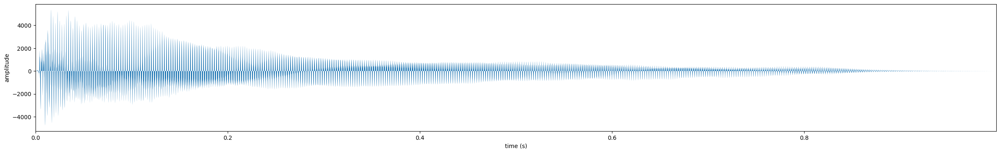

In [8]:
plot_sound(x, times)


## I - Window and Fast Fourier Transform


**1. Window size :** A Hamming window is used, its length covering $700$ ms of the entire signal 

The window is a time section where most of the frequencies can be heard. The goal is to take the largest window possible, to extract as harmonic as possible, while the sound stays the same.

**2. Offset :** The offset is chosen to be about $100$ ms, 

The role of the offset is to skip the uninteresting part of the note, without taking into account the hammer hitting the cord for instance.

**3. Spectral precision after the FFT :** The frequency precision is given by $dF_{\text{min}}=\frac{F_{s}}{Nfft}$, where $Nfft$ is the size of the FFT window. 


In [9]:
N = ceil(
    0.7 * Fs
)  # Window size of analysed signal (only one window of signal is analysed)
dF_min = Fs / N  # Minimal frequency resolution
print("The minimal frequency resolution is of {:.2f} Hz".format(dF_min))


The minimal frequency resolution is of 1.43 Hz


In [10]:
w = np.hamming(N)  # Window
width = 4 * dF_min  # largeur du pic spectral (en Hz) 4*dF_min
eps = float(1e-20)  # precision


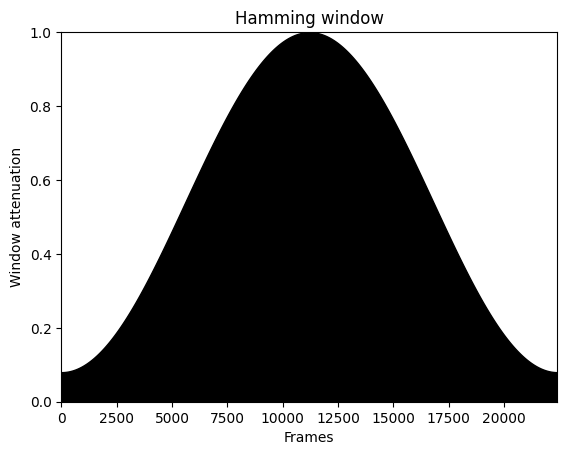

In [11]:
plt.fill_between(np.arange(len(w)), w, color="k")
plt.title("Hamming window")
plt.xlabel("Frames")
plt.ylabel("Window attenuation")
plt.xlim(0, len(w))
plt.ylim(0, 1)
plt.show()


### Discarding the attack of the sound

In [12]:
offset = ceil(0.1 * Fs)
xw = x[offset : offset + N] * w  # xw is the analysed signal frame
n_xw = xw.size


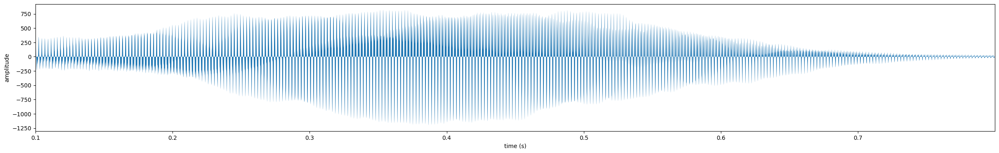

In [13]:
plot_sound(xw, times[offset : offset + N])


This is the temporal visualization of the sound we will be working on.

### Processing for efficient FFT (*by truncating to powers of 2*)

In [14]:
# Minimal number of data points to satisfy the minimal frequency resolution
Nfft_min = Fs / dF_min

# compute the smallest power of two that satisfies the minimal frequency resolution for FFT
p, Nfft = nextpow2(Nfft_min)
x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization

df = Fs / Nfft  # frequency virtual resolution of FFT
print("Frequency virtual resolution of FFT {:.2} Hz".format(df))


Frequency virtual resolution of FFT 0.98 Hz


In [15]:
frequencies = np.arange(Nfft) * df  # equivalent to np.fft.fftfreq(n=Nfft, d=timestep)
X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)


Plot FFT spectrum

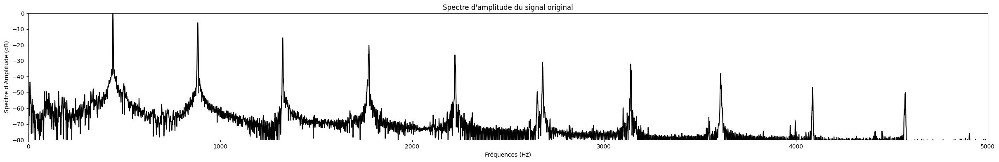

In [16]:
plt.figure(figsize=(30, 4))
plt.plot(frequencies[: int(Nfft / 2)], 20 * np.log10(X_fft[: int(Nfft / 2)]), color="k")
plt.xlim(0, 5000)
plt.ylim(-80, 0)
plt.xlabel("Fréquences (Hz)")
plt.ylabel("Spectre d'Amplitude (dB)")
plt.title("Spectre d'amplitude du signal original")
plt.show()


For **A4_piano.wav**, we clearly see the harmonic around $\sim 440$ Hz and partials (multiples of the fundamental frequency peak).

## II - Fundamental frequency estimation by spectral product/sum method

The different steps include :

#loop on the number of pitches
    - example criterion could use an energy ratio "while criterion > seuil_F0"
    
  #Detection of main F0
  
        -Compute spectral sum
        -locate maximum
        -store value of estimated F0

  #Subtraction of main note (Main F0 with its harmonics)
        
        -localisation of harmonics around theoretical values (with or without inharmonicy coefficient) 
        - beta: harmonicity coefficient ;  alpha: coefficient of tolerance
                
        - Harmonic suppression (wideness of an harmonic to be suppressed depends on the main lob of the TF of the analysis window); suppression of harmonics is done on abs(Xk) on forcing all values of a harmonic peak to the minimum value of the peak (e.g. the level of noise).
         
#end of loop

In [17]:
Fmin = 100  # Minimal F0 frequency that can be detected
Fmax = 900  # Maximal F0 frequency that can be detected
H = 4  # H = nombre de versions compressées
Rmax = ceil((Nfft - 1) / (2 * H))  # fréquence maximale


In [18]:
Nmin = f2idx(Fmin, df) - 1
Nmax = f2idx(Fmax, df)
assert Nmax <= Rmax and Nmin >= 0


Functions sum and product

In [19]:
def spectral_prod(x, R, H):
    """
    Spectral Product
    """
    # TO BE COMPLETED
    prod = np.copy(x)[:R]
    for i in range(2, H + 1):
        compact_x = np.copy(x)[0:R:i]
        prod *= np.pad(
            compact_x,
            (0, len(prod) - len(compact_x)),
            mode="constant",
            constant_values=0,
        )
    return prod


def spectral_sum(x, R, H):
    """
    Spectral sum
    """
    # TO BE COMPLETED
    summ = np.copy(x)[:R]
    for i in range(2, H + 1):
        compact_x = np.copy(x)[0:R:i]
        summ += np.pad(
            compact_x,
            (0, len(summ) - len(compact_x)),
            mode="constant",
            constant_values=0,
        )
    return summ


def spectral_method(x, R, H, method="product"):
    """
    Factorization of previous methods
    """
    assert method in ["sum", "product"]
    if method == "sum":
        return spectral_sum(x, R, H)
    else:
        return spectral_prod(x, R, H)


**What is the minimal value for $N_{fft}$ to obtain a precision of at least dFmin (a power of 2 will be chosen in order to use the fast FFT algorihm) ?**

**What is the maximum frequency that can be used for the computation of S (as a function of H, R and Fs) ?**

**What is then the maximum value of R that can be computed (while being below the Nyquist frequency) ?**


In [20]:
spectral_sum_x = spectral_method(X_fft, Rmax, H, "sum")
spectral_prod_x = spectral_method(X_fft, Rmax, H, "product")


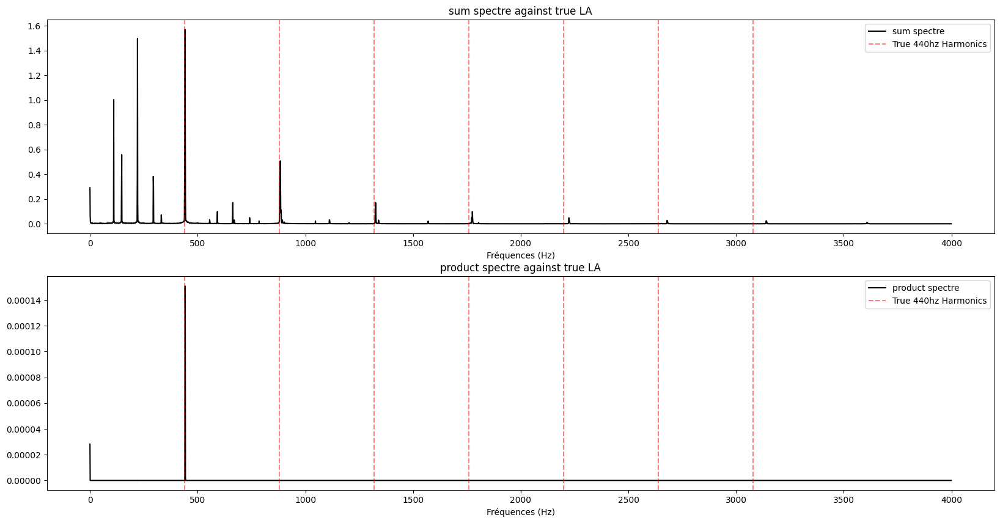

In [21]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))

for idx, method in enumerate(["sum", "product"]):
    spectre = spectral_method(X_fft, Rmax, H, method)
    axs[idx].plot(frequencies[:Rmax], spectre, color="k", label=f"{method} spectre")
    axs[idx].set_xlabel("Fréquences (Hz)")

    for i in range(1, 8):
        axs[idx].axvline(
            440 * i,
            color="red",
            linestyle="--",
            alpha=0.5,
            label="True 440hz Harmonics" if i == 1 else None,
        )

    axs[idx].legend(loc="upper right")
    axs[idx].set_title(f"{method} spectre against true LA")


We can notice a slight divergence in the sum spectre, compared to a true 440Hz.

In [22]:
print(
    "Fundamental frequency using spectral summ: {:.2f} +/- {:.2f}Hz".format(
        frequencies[np.argmax(spectral_sum_x[Nmin : Nmax + 1] + Nmin)], df
    )
)
print(
    "Fundamental frequency using spectral prod: {:.2f} +/- {:.2f}Hz".format(
        frequencies[np.argmax(spectral_prod_x[Nmin : Nmax + 1] + Nmin)], df
    )
)


Fundamental frequency using spectral summ: 341.80 +/- 0.98Hz
Fundamental frequency using spectral prod: 341.80 +/- 0.98Hz


## III - Substraction of the sound corresponding to the detected fundamental frequency

### Harmonics Detection

In this section, we will focus in detecting the fundamental in the interval $[N_\text{min}, N_\text{max}]$.
We then choose the harmonics around $k F_0$, using a percentage of error, $\alpha$. This process is done within the function `get_harmonics_in_spectre`.

**What is an appropriate choice for $\alpha$ ?**
We choose $\alpha=1\%$.

**Is this process of harmonics search appropriate ? for all types of music instruments ?**
This process may not be very precise. Some instruments may have louder harmonics than fundamentals (see this [article](https://opencurriculum.org/5589/harmonic-series-harmonics-intervals-and-instruments/)). This method would then only delete the multiple harmonics and keep the fundamental frequency.

In [23]:
alpha = 0.01  # 1%


def compute_harmonic_range(f0, k, alpha):
    fk_min = int((1 - alpha) * f0 * k)
    fk_max = int((1 + alpha) * f0 * k)
    return fk_min, fk_max


def get_harmonics_in_spectre(
    spectre: np.ndarray,
    ft: np.ndarray,
    frequencies: np.ndarray,
    N_range: list = (Nmin, Nmax),
    harmonic_range_function=compute_harmonic_range,
    alpha: float = alpha,
    return_window: bool = False,
):
    f0 = np.argmax(spectre[Nmin : Nmax + 1]) + Nmin
    harmonic_count = 1
    harmonics = []
    fk_min, fk_max = harmonic_range_function(f0, harmonic_count, alpha)
    if return_window:
        window = []
    while fk_max < len(ft) and fk_max < len(spectre):
        harmonics.append(
            frequencies[fk_min + np.argmax(ft[fk_min : min(fk_max, len(ft))])]
        )
        if return_window:
            window.append((frequencies[fk_min], frequencies[fk_max]))
        harmonic_count += 1
        fk_min, fk_max = harmonic_range_function(f0, harmonic_count, alpha)

    if return_window:
        return np.array(harmonics), np.array(window)
    return np.array(harmonics)


Text(0.5, 1.0, 'Sum spectrum')

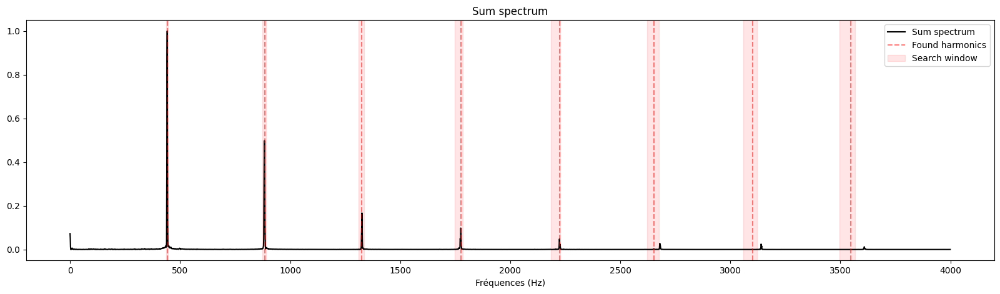

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(20, 5))

spectre = spectral_method(X_fft, Rmax, H, method)
harmonics, search_windows = get_harmonics_in_spectre(
    spectre,
    X_fft,
    frequencies,
    harmonic_range_function=compute_harmonic_range,
    alpha=alpha,
    return_window=True,
)
ax.plot(frequencies[:Rmax], X_fft[:Rmax], color="k", label=f"Sum spectrum")
ax.set_xlabel("Fréquences (Hz)")

for i, (harmonic, search_window) in enumerate(zip(harmonics, search_windows)):
    ax.axvline(
        harmonic,
        color="red",
        linestyle="--",
        alpha=0.5,
        label="Found harmonics" if i == 1 else None,
    )
    ax.axvspan(
        *search_window,
        alpha=0.1,
        color="red",
        label="Search window" if i == 1 else None,
    )

ax.legend(loc="upper right")
ax.set_title(f"Sum spectrum")


### Harmonics suppression

We then delete the harmonics, by setting to noise values all frequencies around the harmonics. This is done through `suppress_harmonics_in_ft`.

In [25]:
def suppress_harmonics_in_ft(
    ft: np.ndarray,
    harmonics: np.ndarray,
    df: float = df,
    width: float = width,
):
    clean_ft = np.copy(ft)
    for harmonic in harmonics:
        f_min = int(harmonic - width)
        f_max = int(harmonic + width)
        clean_ft[f2idx(f_min, df) : min(len(clean_ft), f2idx(f_max, df))] = np.min(
            clean_ft[f2idx(f_min, df) : min(len(clean_ft), f2idx(f_max, df))]
        )
    return clean_ft


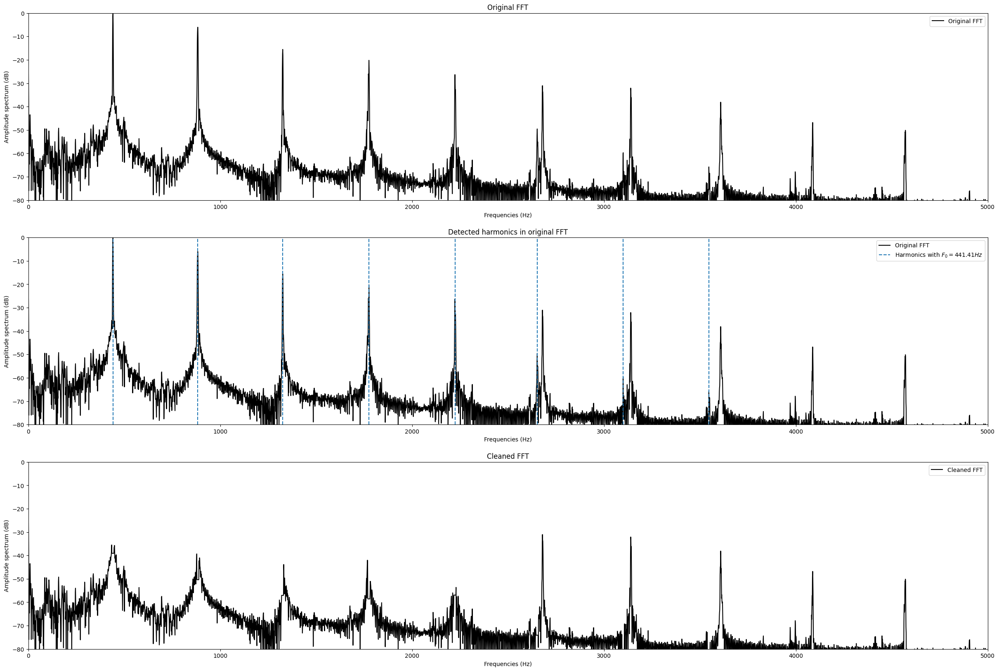

In [26]:
spectre = spectral_method(X_fft, Rmax, H, "sum")
found_harmonics = get_harmonics_in_spectre(
    spectre,
    X_fft,
    frequencies,
    N_range=(Nmin, Nmax),
    harmonic_range_function=compute_harmonic_range,
    alpha=alpha,
)
clean_xfft = suppress_harmonics_in_ft(
    X_fft,
    found_harmonics,
    width=width,
)

fig, axs = plt.subplots(3, 1, figsize=(30, 20))
# plot the original fft
axs[0].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(X_fft[: int(Nfft / 2)]),
    color="k",
    label=f"Original FFT",
)
axs[0].set_title(f"Original FFT")
# plot the detected harmonics
axs[1].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(X_fft[: int(Nfft / 2)]),
    color="k",
    label=f"Original FFT",
)
axs[1].set_title(f"FFT cleaned with {method} method, after 1 iteration")
for i, harmonic in enumerate(found_harmonics):
    axs[1].axvline(
        harmonic,
        color=cmap[0],
        linestyle="--",
        label=r"Harmonics with $F_0={:.2f}Hz$".format(found_harmonics[i])
        if i == 0
        else None,
    )
axs[1].set_title(f"Detected harmonics in original FFT")
# plot the cleaned FFT
axs[2].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(clean_xfft[: int(Nfft / 2)]),
    color="k",
    label=f"Cleaned FFT",
)
axs[2].set_title(f"Cleaned FFT")

for ax in axs:
    ax.set_xlim(0, 5000)
    ax.set_ylim(-80, 0)
    ax.set_xlabel("Frequencies (Hz)")
    ax.set_ylabel("Amplitude spectrum (dB)")

    ax.legend(loc="upper right")


### Stopping Criterion

We then define a criterion, which check if a fft needs to be cleaned. To do so, we takes the spectrum of the signal and the harmonics which we woud like to know if they need to be deleted.
The criterion is met if all the harmonics have a certain energy in the spectrum.

In [27]:
def criterion(
    spectre: np.ndarray, harmonics: np.ndarray, method: str = "sum", df: float = df
):
    return (
        method == "sum"
        and np.sum([spectre[f2idx(freq, df)] for freq in harmonics]) > 0.8
    ) or (
        method == "product"
        and np.sum([spectre[f2idx(freq, df)] for freq in harmonics]) > 1e-5
    )


We then define a function `clean_ft` which cleans a FT while the criterion is met.

In [28]:
def clean_ft(
    X: np.ndarray,
    frequencies: np.ndarray,
    harmonic_range_function,
    method: str = "sum",
    df: float = df,
    Rmax: float = Rmax,
    H: int = H,
    alpha: float = alpha,
    width: float = width,
):
    found_harmonics = []
    clean_iterations = 0
    X_clean = np.copy(X)
    spectre = spectral_method(X_clean, Rmax, H, method)
    harmonics = get_harmonics_in_spectre(
        spectre,
        X,
        frequencies,
        harmonic_range_function=harmonic_range_function,
        N_range=(Nmin, Nmax),
        alpha=alpha,
    )
    clean_again = criterion(spectre, harmonics, method, df)
    while clean_again:
        clean_iterations += 1
        X_clean = suppress_harmonics_in_ft(
            X_clean,
            harmonics,
            df=df,
            width=width,
        )
        found_harmonics.append(harmonics)
        spectre = spectral_method(X_clean, Rmax, H, method)
        harmonics = get_harmonics_in_spectre(
            spectre,
            X_clean,
            frequencies,
            harmonic_range_function=harmonic_range_function,
            N_range=(Nmin, Nmax),
            alpha=alpha,
        )
        clean_again = criterion(spectre, harmonics, method, df)
    return X_clean, clean_iterations, found_harmonics


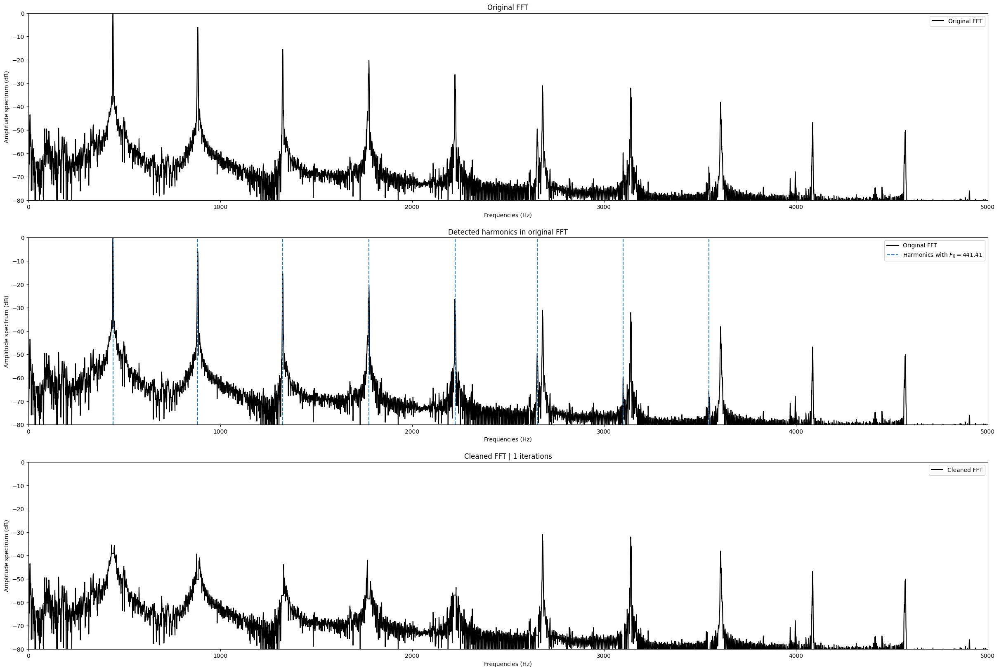

In [29]:
X_clean, clean_iterations, found_harmonics = clean_ft(
    X_fft, frequencies, harmonic_range_function=compute_harmonic_range, method="sum"
)

fig, axs = plt.subplots(3, 1, figsize=(30, 20))
# plot the original fft
axs[0].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(X_fft[: int(Nfft / 2)]),
    color="k",
    label=f"Original FFT",
)
axs[0].set_title(f"Original FFT")
# plot the detected harmonics
axs[1].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(X_fft[: int(Nfft / 2)]),
    color="k",
    label=f"Original FFT",
)
axs[1].set_title(f"FFT cleaned with {method} method, after 1 iteration")
for idx_harmonics, harmonics in enumerate(found_harmonics):
    for i, harmonic in enumerate(harmonics):
        axs[1].axvline(
            harmonic,
            color=cmap[idx_harmonics],
            linestyle="--",
            label=r"Harmonics with $F_0={:.2f}$".format(harmonics[i])
            if i == 0
            else None,
        )

axs[1].set_title(f"Detected harmonics in original FFT")
# plot the cleaned FFT
axs[2].plot(
    frequencies[: int(Nfft / 2)],
    20 * np.log10(X_clean[: int(Nfft / 2)]),
    color="k",
    label=f"Cleaned FFT",
)
axs[2].set_title(f"Cleaned FFT | {clean_iterations} iterations")

for ax in axs:
    ax.set_xlim(0, 5000)
    ax.set_ylim(-80, 0)
    ax.set_xlabel("Frequencies (Hz)")
    ax.set_ylabel("Amplitude spectrum (dB)")
    ax.legend(loc="upper right")


Finally, we check the results for all the samples.

In [30]:
def load_sound_and_parameters(sound_filename: str):
    sound_file = os.path.join(data_path, sound_filename)
    wavefile = load_music(sound_file)
    Fs = int(wavefile.getframerate())
    num_samples = int(wavefile.getnframes())
    data = wavefile.readframes(num_samples)
    data = struct.unpack("{n}h".format(n=num_samples), data)
    x = np.array(data)
    N = ceil(
        0.7 * Fs
    )  # Window size of analysed signal (only one window of signal is analysed)
    dF_min = Fs / N  # Minimal frequency resolution
    offset = ceil(0.1 * Fs)

    w = np.hamming(N)  # Window
    width = 4 * dF_min  # largeur du pic spectral (en Hz) 4*dF_min

    offset = ceil(0.1 * Fs)
    xw = x[offset : offset + N] * w  # xw is the analysed signal frame
    n_xw = xw.size

    Nfft_min = Fs / dF_min

    p, Nfft = nextpow2(Nfft_min)

    df = Fs / Nfft  # frequency virtual resolution of FFT
    frequencies = (
        np.arange(Nfft) * df
    )  # equivalent to np.fft.fftfreq(n=Nfft, d=timestep)

    Rmax = ceil((Nfft - 1) / (2 * H))  # fréquence maximale

    Nmin = f2idx(Fmin, df) - 1
    Nmax = f2idx(Fmax, df)
    assert Nmax <= Rmax and Nmin >= 0
    return xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df


100%|██████████| 9/9 [00:00<00:00, 35.11it/s]


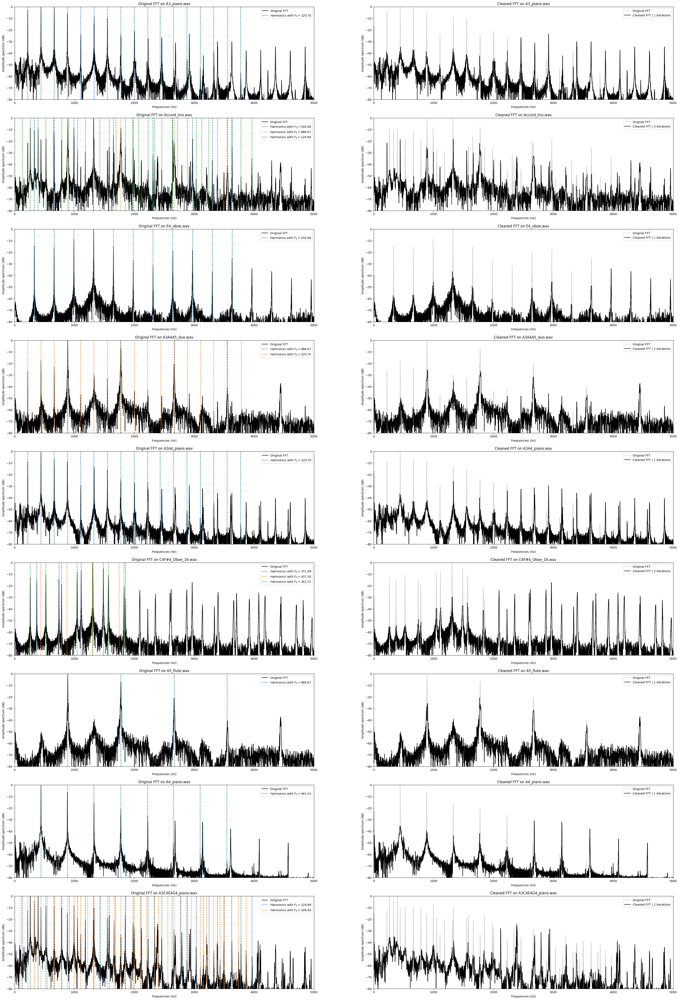

In [31]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 60))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)
    X_clean, clean_iterations, found_harmonics = clean_ft(
        X_fft,
        frequencies,
        harmonic_range_function=compute_harmonic_range,
        method="sum",
        df=df,
        Rmax=Rmax,
        H=H,
        alpha=alpha,
        width=width,
    )
    axs[idx_sound, 0].plot(
        frequencies[: int(Nfft / 2)],
        20 * np.log10(X_fft[: int(Nfft / 2)]),
        color="k",
        label=f"Original FFT",
    )
    for idx_harmonics, harmonics in enumerate(found_harmonics):
        for i, harmonic in enumerate(harmonics):
            axs[idx_sound, 0].axvline(
                harmonic,
                color=cmap[idx_harmonics],
                linestyle="--",
                label=r"Harmonics with $F_0={:.2f}$".format(harmonics[i])
                if i == 0
                else None,
            )
    axs[idx_sound, 0].set_title(f"Original FFT on {sound_filename}")
    axs[idx_sound, 1].plot(
        frequencies[: int(Nfft / 2)],
        20 * np.log10(X_fft[: int(Nfft / 2)]),
        color="k",
        alpha=0.2,
        label=f"Original FFT",
    )
    axs[idx_sound, 1].plot(
        frequencies[: int(Nfft / 2)],
        20 * np.log10(X_clean[: int(Nfft / 2)]),
        color="k",
        label=f"Cleaned FFT | {clean_iterations} iterations",
    )
    axs[idx_sound, idx].set_title(f"Cleaned FFT on {sound_filename}")
    for ax in axs[idx_sound]:
        ax.set_xlim(0, 5000)
        ax.set_ylim(-80, 0)
        ax.set_xlabel("Frequencies (Hz)")
        ax.set_ylabel("Amplitude spectrum (dB)")
        ax.legend(loc="upper right")


We notice that the sound `C4F#4_Oboe_16.wav` (the 5th) is sampled with `Fs=16000Hz`, explaining why the algorithm isn't fetching harmonics beyond 2048Hz.

## IV - Some refinements or options

### A different $F_0$ detector

We then implement the spectral product. Firstly, we plot the found harmonics of each method.


100%|██████████| 9/9 [00:00<00:00, 25.01it/s]


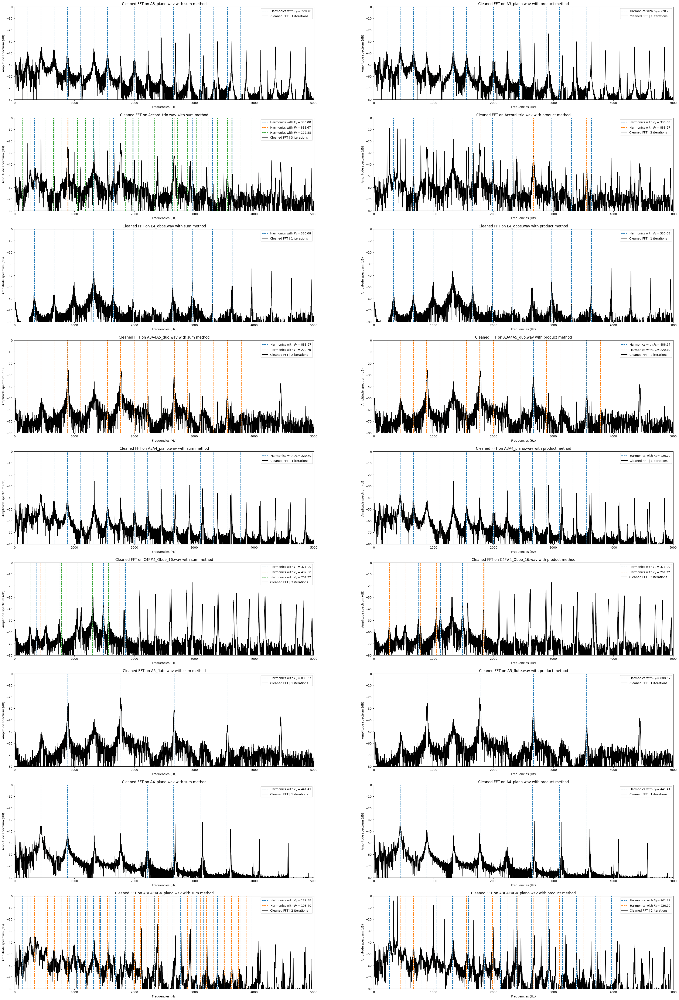

In [32]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 60))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)

    for idx_method, method in enumerate(["sum", "product"]):
        X_clean, clean_iterations, found_harmonics = clean_ft(
            X_fft,
            frequencies,
            harmonic_range_function=compute_harmonic_range,
            method=method,
            df=df,
            Rmax=Rmax,
            H=H,
            alpha=alpha,
            width=width,
        )

        for idx_harmonics, harmonics in enumerate(found_harmonics):
            for i, harmonic in enumerate(harmonics):
                axs[idx_sound, idx_method].axvline(
                    harmonic,
                    color=cmap[idx_harmonics],
                    linestyle="--",
                    label=r"Harmonics with $F_0={:.2f}$".format(harmonics[i])
                    if i == 0
                    else None,
                )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_clean[: int(Nfft / 2)]),
            color="k",
            label=f"Cleaned FFT | {clean_iterations} iterations",
        )

        axs[idx_sound, idx_method].set_title(
            f"Cleaned FFT on {sound_filename} with {method} method"
        )
        axs[idx_sound, idx_method].set_xlim(0, 5000)
        axs[idx_sound, idx_method].set_ylim(-80, 0)
        axs[idx_sound, idx_method].set_xlabel("Frequencies (Hz)")
        axs[idx_sound, idx_method].set_ylabel("Amplitude spectrum (dB)")
        axs[idx_sound, idx_method].legend(loc="upper right")


We notice that the 2 methods often provide the same results, despite some differences:
* there are very similar on single note sounds. It could be great to check which method is more robust, with a smaller `df`. 
* the sum method tends to find more notes in a sound, like on `Accord_trio.wav` (the 2nd) and `C4F#4_Oboe_16.wav` (the 6th). This is mostly due to the criterion, which is a bit hard to define perfectly.
* the product method tends to find harmonics, instead of fundamentals, like on `A3C4E4G4_piano.wav` (the last).

We now plot only the cleaned FFT of each method, to see better without the harmonics.

100%|██████████| 9/9 [00:00<00:00, 61.96it/s]


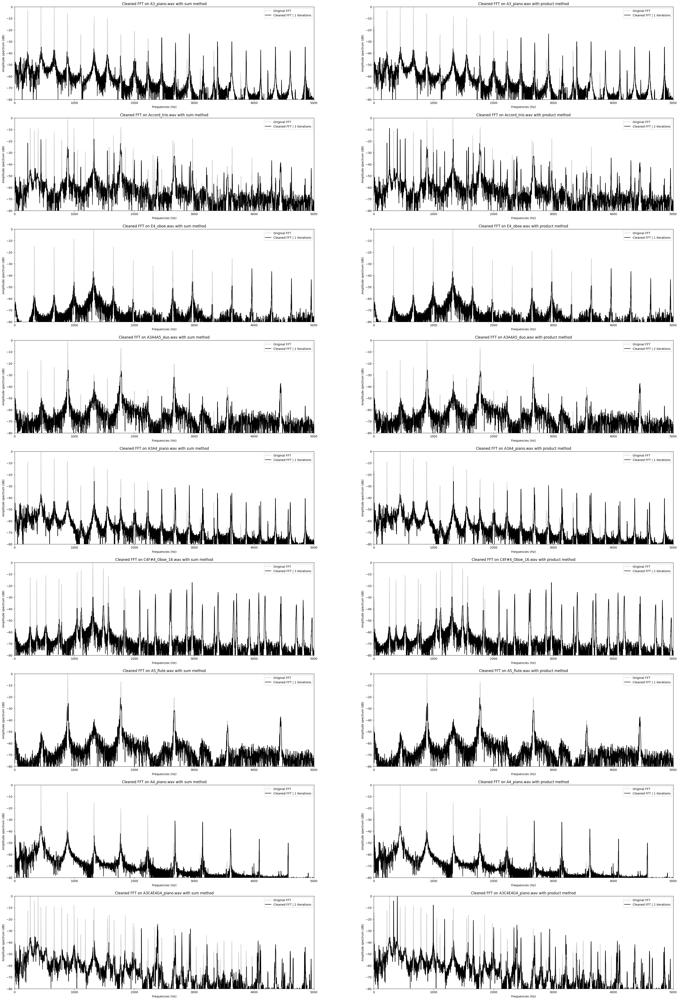

In [33]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 60))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)

    for idx_method, method in enumerate(["sum", "product"]):
        X_clean, clean_iterations, found_harmonics = clean_ft(
            X_fft,
            frequencies,
            harmonic_range_function=compute_harmonic_range,
            method=method,
            df=df,
            Rmax=Rmax,
            H=H,
            alpha=alpha,
            width=width,
        )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_fft[: int(Nfft / 2)]),
            color="k",
            label=f"Original FFT",
            alpha=0.2,
        )

        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_clean[: int(Nfft / 2)]),
            color="k",
            label=f"Cleaned FFT | {clean_iterations} iterations",
        )

        axs[idx_sound, idx_method].set_title(
            f"Cleaned FFT on {sound_filename} with {method} method"
        )
        axs[idx_sound, idx_method].set_xlim(0, 5000)
        axs[idx_sound, idx_method].set_ylim(-80, 0)
        axs[idx_sound, idx_method].set_xlabel("Frequencies (Hz)")
        axs[idx_sound, idx_method].set_ylabel("Amplitude spectrum (dB)")
        axs[idx_sound, idx_method].legend(loc="upper right")


With my current implementation, the sum is performing slightly better, especially on the last sound.

### Taking account of inharmonicity

**What is an appropriate value of $\beta$ for a piano sound ? for an oboe sound ?** 

Its value is 0.0002. For a oboe, it is 0.0001.

**Can this coefficient be automatically estimated ?** 

It looks like it can be estimated. See *A parametric model and estimation techniques for the inharmonicity and tuning of the piano* by Rigaud, François and David, Bertrand and Daudet, Laurent (2013). The inharmonicity is modelled, using only a small subsets of notes. However, this method is made for the piano.  

*Measuring inharmonicity through pitch extraction* by Alexander Galembo and Anders Askenfelt (1994) is a method to estimate inharmonicity, directly from cepstrum and harmonic product spectrum.  

We compute the inharmonicity range, using the spectral sum method.

In [34]:
def compute_inharmonic_range(f0, k, alpha, beta=0.0002):
    f_inharmo = k * f0 * np.sqrt(1 + beta * k**2)
    fk_min = int((1 - alpha) * f_inharmo)
    fk_max = int((1 + alpha) * f_inharmo)
    return fk_min, fk_max


100%|██████████| 9/9 [00:00<00:00, 16.86it/s]


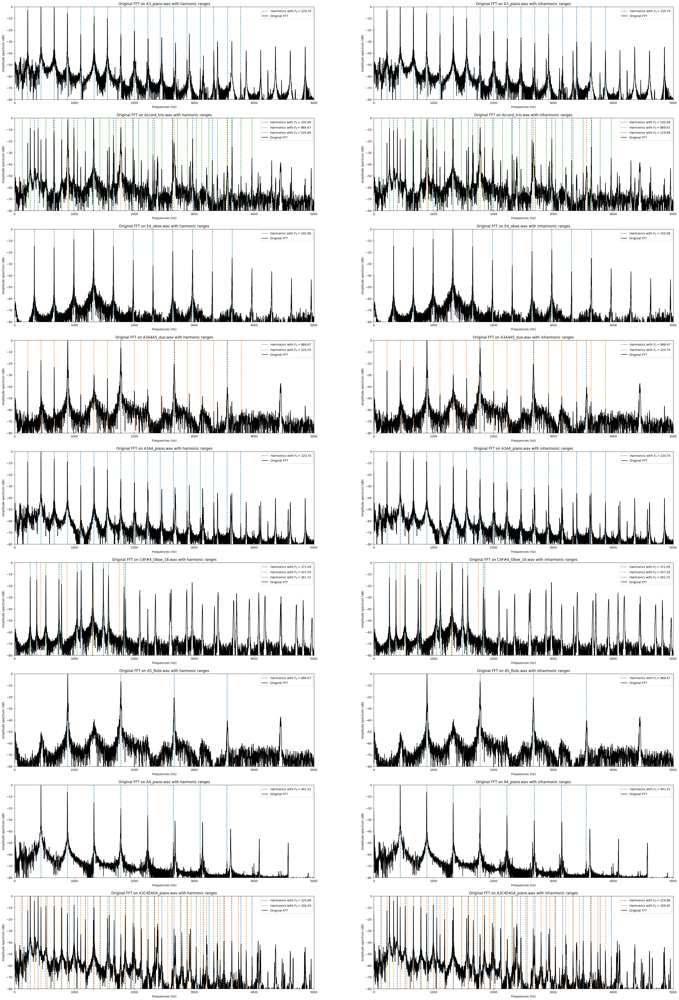

In [35]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 60))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)

    for idx_method, (method_name, method) in enumerate(
        {
            "harmonic": compute_harmonic_range,
            "inharmonic": compute_inharmonic_range,
        }.items()
    ):
        X_clean, clean_iterations, found_harmonics = clean_ft(
            X_fft,
            frequencies,
            harmonic_range_function=method,
            method="sum",
            df=df,
            Rmax=Rmax,
            H=H,
            alpha=alpha,
            width=width,
        )

        for idx_harmonics, harmonics in enumerate(found_harmonics):
            for i, harmonic in enumerate(harmonics):
                axs[idx_sound, idx_method].axvline(
                    harmonic,
                    color=cmap[idx_harmonics],
                    linestyle="--",
                    label=r"Harmonics with $F_0={:.2f}$".format(harmonics[i])
                    if i == 0
                    else None,
                )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_fft[: int(Nfft / 2)]),
            color="k",
            label=f"Original FFT",
        )

        axs[idx_sound, idx_method].set_title(
            f"Original FFT on {sound_filename} with {method_name} ranges"
        )
        axs[idx_sound, idx_method].set_xlim(0, 5000)
        axs[idx_sound, idx_method].set_ylim(-80, 0)
        axs[idx_sound, idx_method].set_xlabel("Frequencies (Hz)")
        axs[idx_sound, idx_method].set_ylabel("Amplitude spectrum (dB)")
        axs[idx_sound, idx_method].legend(loc="upper right")


We can notice a good improvement in the harmonic locations. This leads to improved cleaned FFT, as seen below.

100%|██████████| 9/9 [00:00<00:00, 88.50it/s]


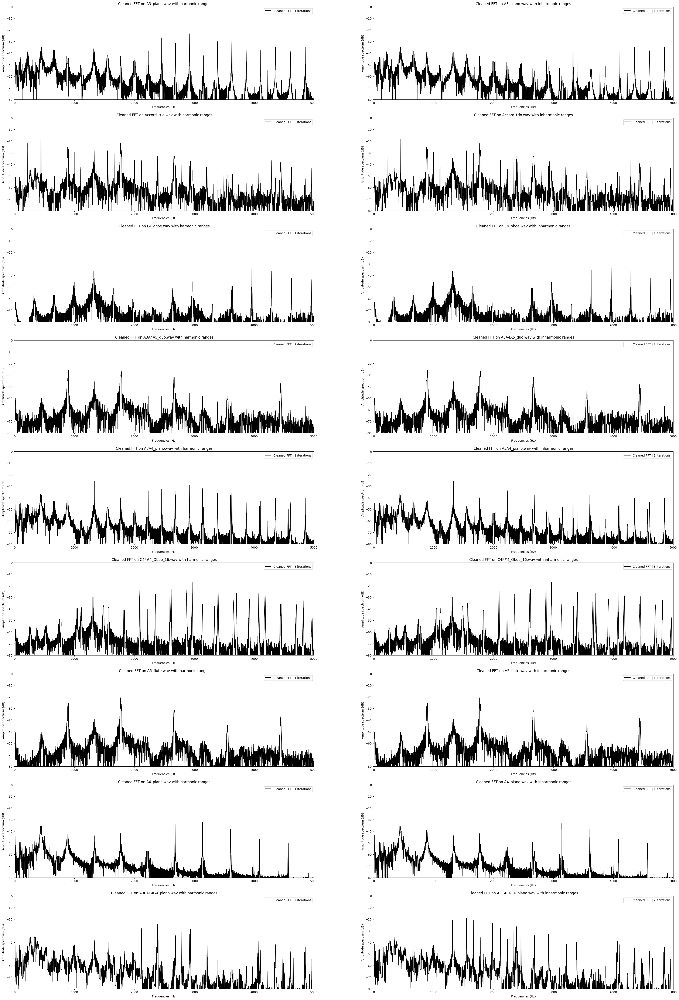

In [36]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 60))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)

    for idx_method, (method_name, method) in enumerate(
        {
            "harmonic": compute_harmonic_range,
            "inharmonic": compute_inharmonic_range,
        }.items()
    ):
        X_clean, clean_iterations, found_harmonics = clean_ft(
            X_fft,
            frequencies,
            harmonic_range_function=method,
            method="sum",
            df=df,
            Rmax=Rmax,
            H=H,
            alpha=alpha,
            width=width,
        )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_clean[: int(Nfft / 2)]),
            color="k",
            label=f"Cleaned FFT | {clean_iterations} iterations",
        )

        axs[idx_sound, idx_method].set_title(
            f"Cleaned FFT on {sound_filename} with {method_name} ranges"
        )
        axs[idx_sound, idx_method].set_xlim(0, 5000)
        axs[idx_sound, idx_method].set_ylim(-80, 0)
        axs[idx_sound, idx_method].set_xlabel("Frequencies (Hz)")
        axs[idx_sound, idx_method].set_ylabel("Amplitude spectrum (dB)")
        axs[idx_sound, idx_method].legend(loc="upper right")


### Harmonic suppression with spectral smoothness principle

Below is my attemps at using spectral smoothness. Below is the cleaned FFT I obtained using this method.

My code still have a problem, which I didn't have time to fix.

In [46]:
def smooth_suppress_harmonics_in_ft(
    ft: np.ndarray,
    spectre: np.ndarray,
    harmonics: np.ndarray,
    df: float = df,
    width: float = width,
):
    clean_ft = np.copy(ft)
    spectre_at_harmonics = spectre[[f2idx(h, df) for h in harmonics]]
    smooth_spectre_at_harmonics = np.copy(spectre_at_harmonics)
    smooth_spectre_at_harmonics[:-1] += spectre_at_harmonics[1:]
    smooth_spectre_at_harmonics[1:] += spectre_at_harmonics[:-1]
    smooth_spectre_at_harmonics /= 3

    for idx_harmonic, harmonic in enumerate(harmonics):
        f_min = int(harmonic - width)
        f_max = int(harmonic + width)

        # 2 conditions: if the smooth spectral value is above the spectral value
        if (
            spectre_at_harmonics[idx_harmonic]
            < smooth_spectre_at_harmonics[idx_harmonic]
            or idx_harmonic == 0
        ):
            clean_ft[f2idx(f_min, df) : min(len(clean_ft), f2idx(f_max, df))] = np.min(
                clean_ft[f2idx(f_min, df) : min(len(clean_ft), f2idx(f_max, df))]
            )
        ###
        ### the problem comes from the following lines
        ### The clean value is not small enough
        ###
        else:
            clean_ft[f2idx(f_min, df) : min(len(clean_ft), f2idx(f_max, df))] = (
                spectre_at_harmonics[idx_harmonic] - smooth_spectre_at_harmonics[idx_harmonic]
            )
    return clean_ft

def smooth_clean_ft(
    X: np.ndarray,
    frequencies: np.ndarray,
    harmonic_range_function,
    method: str = "sum",
    df: float = df,
    Rmax: float = Rmax,
    H: int = H,
    alpha: float = alpha,
    width: float = width,
):
    found_harmonics = []
    clean_iterations = 0
    X_clean = np.copy(X)
    spectre = spectral_method(X_clean, Rmax, H, "sum")
    harmonics = get_harmonics_in_spectre(
        spectre,
        X,
        frequencies,
        harmonic_range_function=compute_inharmonic_range,
        N_range=(Nmin, Nmax),
        alpha=alpha,
    )

    clean_again = criterion(spectre, harmonics, method, df)
    while clean_again:
        clean_iterations += 1
        X_clean = smooth_suppress_harmonics_in_ft(
            X_clean,
            spectre,
            harmonics,
            df=df,
            width=width,
        )
        found_harmonics.append(harmonics)

        spectre = spectral_method(X_clean, Rmax, H, "sum")
        harmonics = get_harmonics_in_spectre(
            spectre,
            X_clean,
            frequencies,
            harmonic_range_function=compute_inharmonic_range,
            N_range=(Nmin, Nmax),
            alpha=alpha,
        )
        clean_again = criterion(spectre, harmonics, method, df)

    return X_clean, clean_iterations, found_harmonics


100%|██████████| 9/9 [00:00<00:00, 63.11it/s]


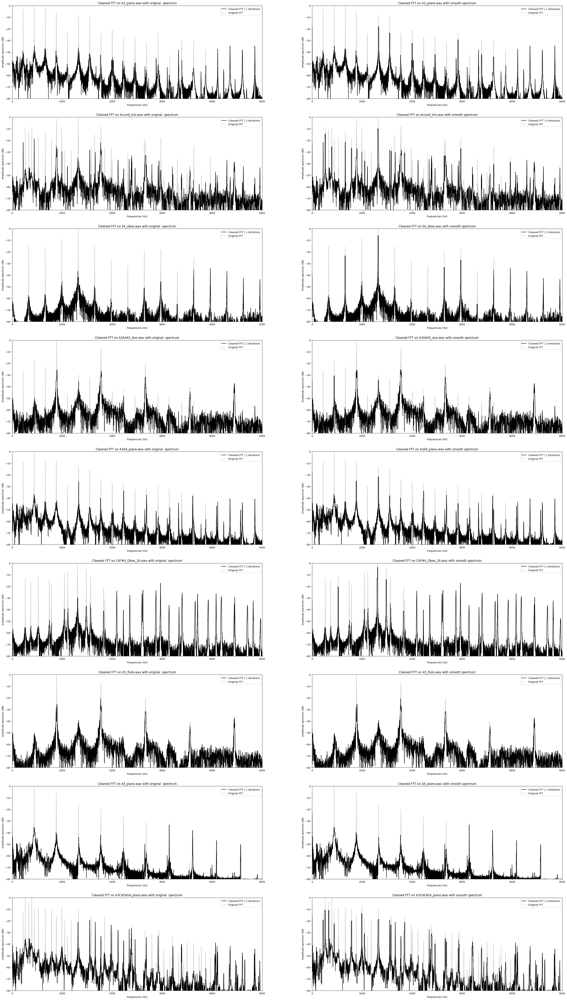

In [47]:
sound_filenames = [
    f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))
]

fig, axs = plt.subplots(len(sound_filenames), 2, figsize=(40, 8 * len(sound_filenames)))
for idx_sound, sound_filename in enumerate(tqdm(sound_filenames)):
    xw, frequencies, Nfft, eps, Rmax, (Nmin, Nmax), df = load_sound_and_parameters(
        sound_filename
    )
    x_fft = np.fft.fft(xw, n=Nfft)  # calcul FFT
    x_fft /= np.max(np.abs(x_fft)) + eps  # Normalization
    X_fft = np.abs(x_fft)  # absolute value of FFT (phase doesn't play a role)

    for idx_method, (method_name, method) in enumerate(
        {
            "original ": clean_ft,
            "smooth": smooth_clean_ft,
        }.items()
    ):
        X_clean, clean_iterations, found_harmonics = method(
            X_fft,
            frequencies,
            harmonic_range_function=compute_inharmonic_range,
            method="sum",
            df=df,
            Rmax=Rmax,
            H=H,
            alpha=alpha,
            width=width,
        )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_clean[: int(Nfft / 2)]),
            color="k",
            label=f"Cleaned FFT | {clean_iterations} iterations",
        )
        axs[idx_sound, idx_method].plot(
            frequencies[: int(Nfft / 2)],
            20 * np.log10(X_fft[: int(Nfft / 2)]),
            color="k",
            alpha=0.2,
            label=f"Original FFT",
        )

        axs[idx_sound, idx_method].set_title(
            f"Cleaned FFT on {sound_filename} with {method_name} spectrum"
        )
        axs[idx_sound, idx_method].set_xlim(0, 5000)
        axs[idx_sound, idx_method].set_ylim(-80, 0)
        axs[idx_sound, idx_method].set_xlabel("Frequencies (Hz)")
        axs[idx_sound, idx_method].set_ylabel("Amplitude spectrum (dB)")
        axs[idx_sound, idx_method].legend(loc="upper right")
